# CarND-Advanced-Lane-Lines

## Project Steps:

1. Camera calibration
2. Distortion correction
3. Color/gradient threshold
4. Perspective transform
5. Detect lane lines
6. Determine the lane curvature
7. Drawing 
8. Pipeline (Video)

## 1. Camera calibration


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import toolbox
import pickle
%matplotlib inline

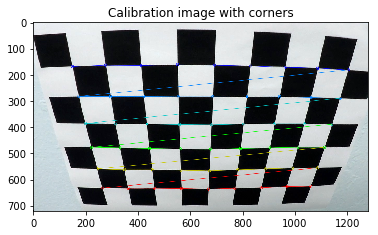

In [2]:
#Finding Corners in a calibration image
fname = './camera_cal/calibration2.jpg'
img = cv2.imread(fname)

# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)
    plt.title("Calibration image with corners")


In [3]:
#prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

#read all images in folder
images = glob.glob('./camera_cal/calibration*.jpg')

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros([ny*nx,3], np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x, y coordinates

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# If cornes are found, add object points, add image points and draw corners
for name in images:
    img = cv2.imread(name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

In [4]:
#Undistorting a test image:
fname = './camera_cal/calibration1.jpg'
img = cv2.imread(fname)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#plt.imshow(img)

#Camera calibration, given object points, image points, and the shape of the grayscale image:
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

In [5]:
#Save Calibrate Parameters
save_dict = {'mtx': mtx, 'dist': dist}
with open('calibrate_camera.p', 'wb') as f:
    pickle.dump(save_dict, f)

## 2. Distortion correction


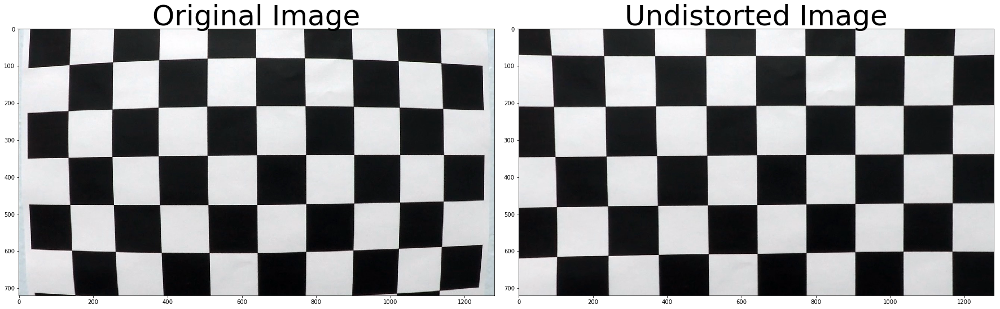

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### An example of a distortion-corrected image.

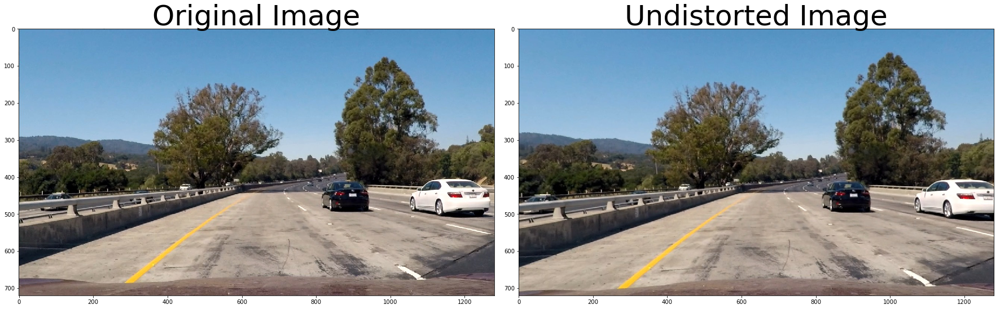

In [7]:
fname = './test_images/test1.jpg'
img = mpimg.imread(fname)

##Note: If you are reading in an image using mpimg.imread() 
##this will read in an RGB image and you should convert to grayscale using cv2.COLOR_RGB2GRAY
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

##Another way to retrieve the image shape, is to get them directly 
##from the color image by retrieving the first two values in the color image shape array using img.shape[0:2].
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 3. Color & Gradient Threshold

In [8]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
import thresholding

In [9]:
# Edit this function to create your own pipeline.
def pipeline(img):
    
    img = np.copy(img)
    
    ########################################################################################
    ##STEP: DISTORSION CORRECTION
    ########################################################################################
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    ########################################################################################
    #STEP:  LANE FINDING
    ########################################################################################
       
    combined_binary, sxbinary, s_binary = thresholding.process_image_grad_color(img)
    
    ########################################################################################
    ########################################################################################

    
    ########################################################################################
    ##STEP: WARPER IMAGE
    #top_down, poly, _, _ = warper(combined_binary, mtx, dist, draw_poly=False)
    ########################################################################################
    
    #toolbox.plot3img(s_binary,sxbinary,color_binary)
    return undist, combined_binary
    


## 3.1 Color Thresholds: 
### Testing Color Thresholds in RGB Space

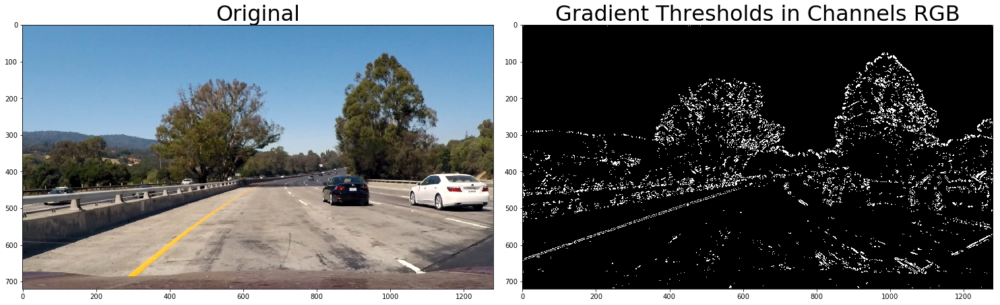

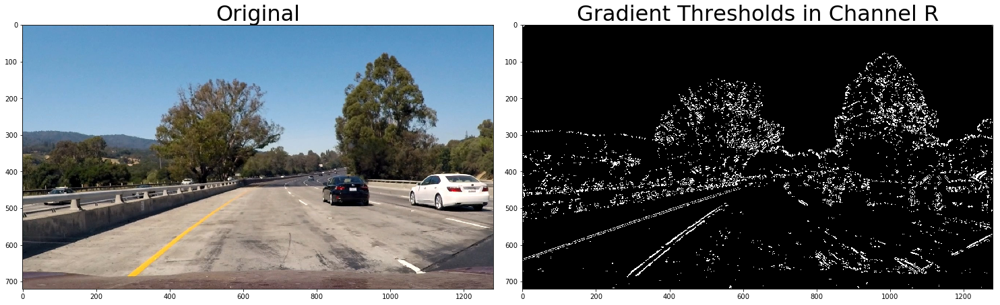

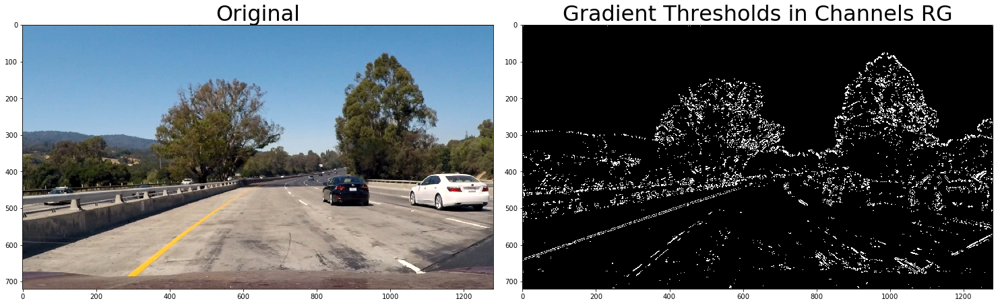

In [10]:
fname = './test_images/test1.jpg'

##Note: If you read in an image using matplotlib.image.imread() you will get an RGB image, 
##but if you read it in using OpenCV cv2.imread() this will give you a BGR image.

#Read BGR image
#img = cv2.imread(fname)

#Read RGB image
img = mpimg.imread(fname)
img = np.copy(img)

R = img[:, :, 0]
G = img[:, :, 1]

RG = np.dstack(( R, G, np.zeros_like(R)))

R  = np.dstack(( R, np.zeros_like(R), np.zeros_like(R)))

combined_img = thresholding.combine_grad(img)
toolbox.plot2img(img, combined_img,['Original', 'Gradient Thresholds in Channels RGB'])

combined_img = thresholding.combine_grad(R)
toolbox.plot2img(img, combined_img, ['Original', 'Gradient Thresholds in Channel R'])

combined_img = thresholding.combine_grad(RG)
toolbox.plot2img(img, combined_img, ['Original', 'Gradient Thresholds in Channels RG'])


## 3.2  Testing Combined Thresholds
+ Gradient thresholds using RGB Space
+ Color thresholds using HLS Space

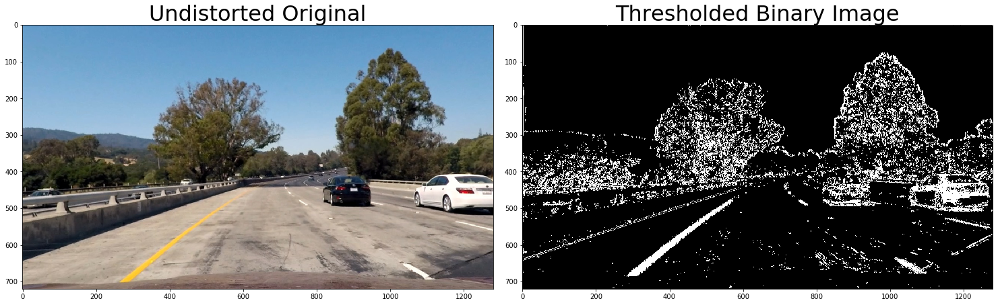

In [11]:
fname = './test_images/test1.jpg'
#Read RGB image
img = mpimg.imread(fname)
undist, combined_binary = pipeline(img)

toolbox.plot2img(undist, combined_binary,['Undistorted Original', 'Thresholded Binary Image'])

# Plot the result

#### Now, I test combined thresholds over all images in test folder

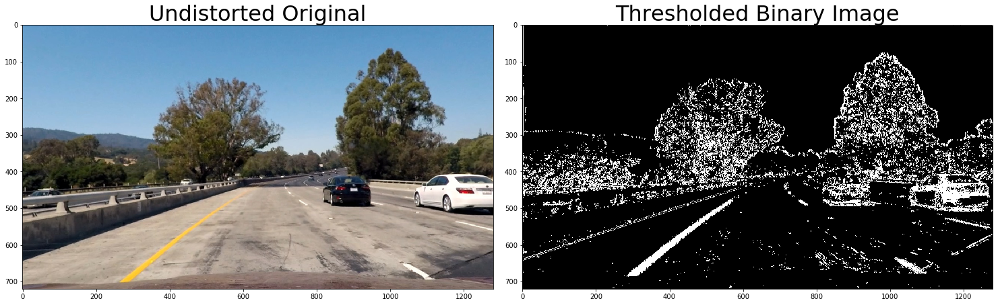

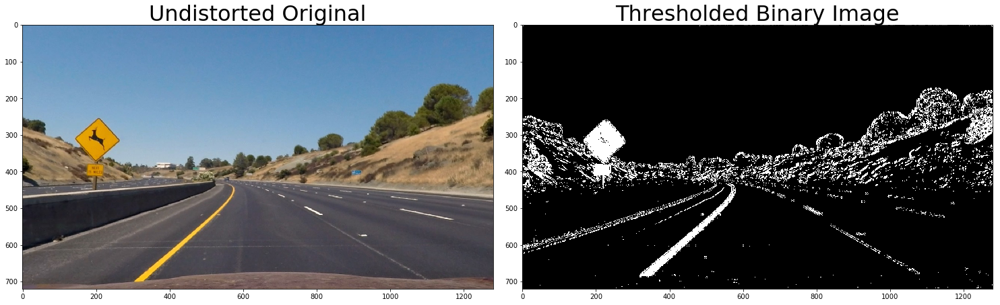

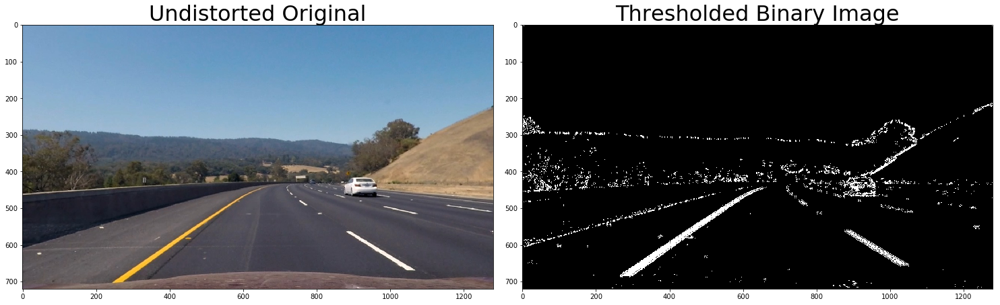

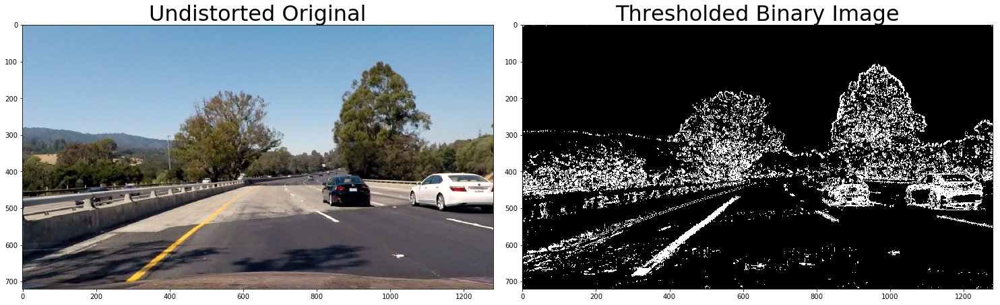

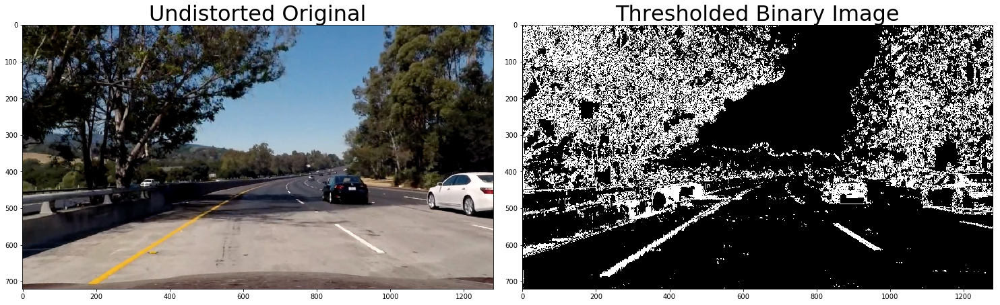

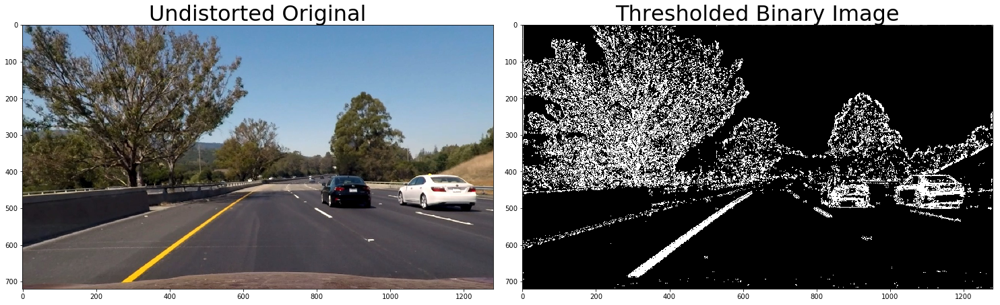

In [13]:
#read all images in folder
images = glob.glob('./test_images/test*.jpg')
for fname in images:
    #Read RGB image
    img = mpimg.imread(fname)
    undist, combined_binary = pipeline(img)
    toolbox.plot2img(undist, combined_binary, ['Undistorted Original', 'Thresholded Binary Image'])

## 4. Perspective Transform

**Notes:**
Pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above.

The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

## 4.1 Warper Function

In [14]:
#The code for my perspective transform includes a function called `warper()`, 
#which appears in the file `lines.py` 
# lines.warper(img)
import lines

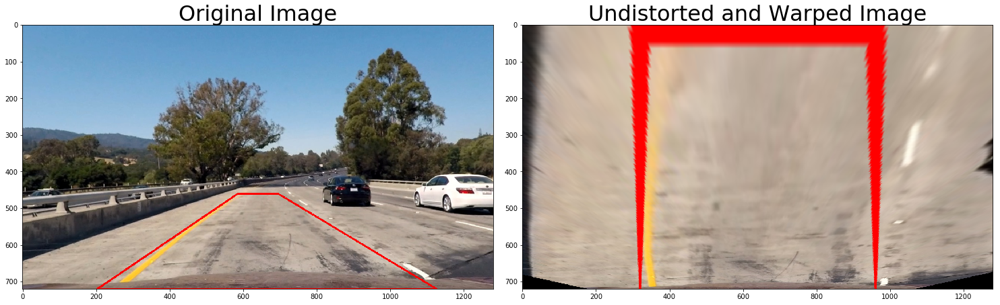

In [15]:
fname = './test_images/test1.jpg'
#Read RGB image
img = mpimg.imread(fname)
undist = cv2.undistort(img, mtx, dist, None, mtx)
top_down, poly, _,_ = lines.warper(undist, mtx, dist, draw_poly=True)

toolbox.plot2img(poly, top_down, ['Original Image','Undistorted and Warped Image'])

## 5. Detect lane lines

Locate the Lane Lines and Fit a Polynomial

Notes:
You now have a thresholded warped image and you're ready to map out the lane lines! There are many ways you could go about this, but here's one example of how you might do it:

Line Finding Method: Peaks in a Histogram

After applying calibration, thresholding, and a perspective transform to a road image, you should have a binary image where the lane lines stand out clearly. However, you still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.

I first take a histogram along all the columns in the lower half of the image like this:

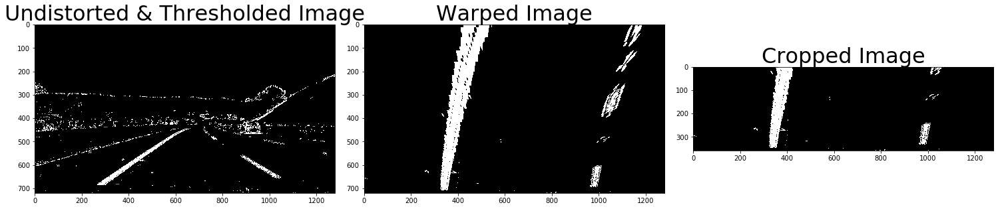

In [16]:
fname = './test_images/test3.jpg'
#Read RGB image
img = mpimg.imread(fname)

undist, combined_binary = pipeline(img)
top_down, poly, _, _ = lines.warper(combined_binary, mtx, dist, draw_poly=False)
binary_warped = top_down[top_down.shape[0]//2:,:]

toolbox.plot3img(combined_binary, top_down, binary_warped, ['Undistorted & Thresholded Image','Warped Image','Cropped Image'])



## 5.1 Histogram

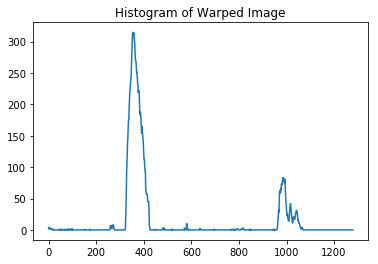

In [17]:
histogram = np.sum(binary_warped, axis=0)
plt.plot(histogram)
plt.title('Histogram of Warped Image')
plt.show()

## 5.2 Implement Sliding Windows and Fit a Polynomial

In [18]:
#I use ‘fit_poly()’ function,
#which appears in the file lines.py
#lines.find_poly()
import lines

In [19]:
def fit_poly(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    #######
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    ######
    return out_img, nonzerox, nonzeroy,leftx, lefty, right_lane_inds, left_lane_inds, left_fit, right_fit

## 5.2.1 Visualization of Sliding Windows and a second order polynomial

In [20]:
#read all images in folder
images = glob.glob('./test_images/test*.jpg')
for fname in images:
    #Read RGB image
    img = mpimg.imread(fname)

    undist, combined_binary = pipeline(img)
    binary_warped, poly, _, _ = lines.warper(combined_binary, mtx, dist, draw_poly=False)

    out_img, nonzerox, nonzeroy, leftx, lefty, right_lane_inds, left_lane_inds, left_fit, right_fit = fit_poly(binary_warped)
    '''
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ##
    
    ##
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title('2nd order poly in Sliding Window Search')
    plt.show()
    '''

TypeError: expected x and y to have same length

In [ ]:
len(leftx)

## 5.3. Skip the sliding windows step once you know where the lines are

In [21]:
#I use ‘fit_line_with_line_info()’ function,
#which appears in the file lines.py
#lines.fit_line_with_line_info()
import lines

## 6. Determine the Lane Curvature


### 6.1 Function to calculate the radius of curvature of the lane and the position of the vehicle with respect to center

In [22]:
#Then I use ‘find_curvature()’ function,
#which appears in the file lines.py
#lines.find_curvature()
import lines

In [23]:
#read all images in folder
images = glob.glob('./test_images/test1.jpg')
for fname in images:
    #Read RGB image
    img = mpimg.imread(fname)

    undist, combined_binary = pipeline(img)
    binary_warped, poly, _, _ = lines.warper(combined_binary, mtx, dist, draw_poly=False)

    out_img, nonzerox, nonzeroy, leftx, lefty, right_lane_inds, left_lane_inds, left_fit, right_fit = fit_poly(binary_warped)
    

TypeError: expected x and y to have same length

In [24]:
print(leftx)
print(lefty)
print(binary_warped.shape[0])

NameError: name 'leftx' is not defined

In [25]:
def find_curvature(warped, leftx, rightx):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    num_rows = warped.shape[0]
    ploty = np.linspace(0, num_rows-1, num=num_rows)# to cover same y-range as image
    y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    return left_curverad, right_curverad

In [26]:
left_curverad, right_curverad = find_curvature(binary_warped, leftx, lefty)
print(left_curverad, right_curverad)

NameError: name 'leftx' is not defined

### 6.2 Function to calculate the position of the vehicle with respect to center

## 7. Drawing

In [27]:
def draw_poly(undist, warped, right_fit , left_fit, left_curve, right_curve, vehicle_offset):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    ##
    # Annotate lane curvature values and vehicle offset from center
    avg_curve = (left_curve + right_curve)/2
    label_str = 'Radius of curvature: %.1f m' % avg_curve
    result = cv2.putText(result, label_str, (30,40), 0, 1, (0,0,0), 2, cv2.LINE_AA)

    label_str = 'Vehicle offset from lane center: %.1f m' % vehicle_offset
    result = cv2.putText(result, label_str, (30,70), 0, 1, (0,0,0), 2, cv2.LINE_AA)

    return result

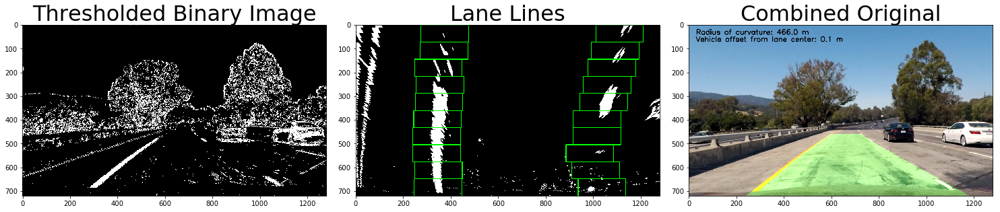

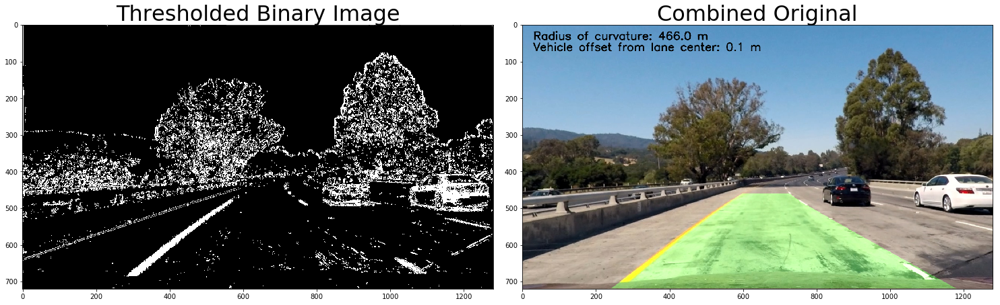

In [30]:
##Test Draw images
left_curve, right_curve, vehicle_offset = 444.01 , 488.01 , 0.1 ,
fname = './test_images/test4.jpg'
#Read RGB image
image = mpimg.imread(fname)

undist, combined_binary = pipeline(img)
top_down, poly, M, Minv = lines.warper(combined_binary, mtx, dist, draw_poly=False)
out_img, leftx, lefty, nonzerox, nonzeroy, right_lane_inds, left_lane_inds, left_fit, right_fit = lines.fit_poly(top_down)

result = draw_poly(undist, top_down, right_fit , left_fit, left_curve, right_curve, vehicle_offset)

toolbox.plot3img(combined_binary, out_img, result, ['Thresholded Binary Image', 'Lane Lines','Combined Original'])
toolbox.plot2img(combined_binary,result,['Thresholded Binary Image','Combined Original'])

In [38]:
# Read camera calibration coefficients
with open('calibrate_camera.p', 'rb') as f:
    coefficients = pickle.load(f)
mtx = coefficients['mtx']
dist = coefficients['dist']

In [39]:
def process_image(img):
    undist, combined_binary = pipeline(img)
    top_down, poly, M, Minv = lines.warper(combined_binary, mtx, dist, draw_poly=False)
    out_img, leftx, lefty, nonzerox, nonzeroy, right_lane_inds, left_lane_inds, left_fit, right_fit = lines.fit_poly(top_down)
    result = draw_poly(undist, top_down, right_fit , left_fit, left_curve, right_curve, vehicle_offset)
    #if (True):
    #toolbox.plot3img(combined_binary, out_img, result, ['Thresholded Binary Image', 'Lane Lines','Combined Original'])
    return result

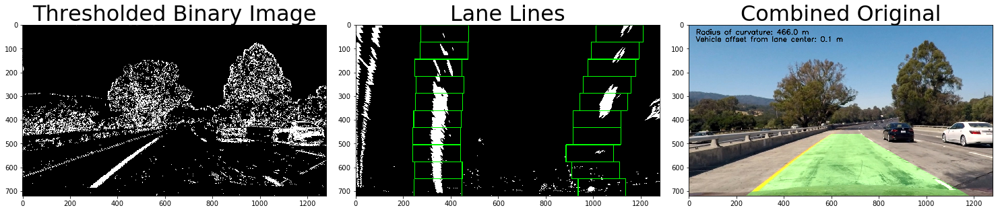

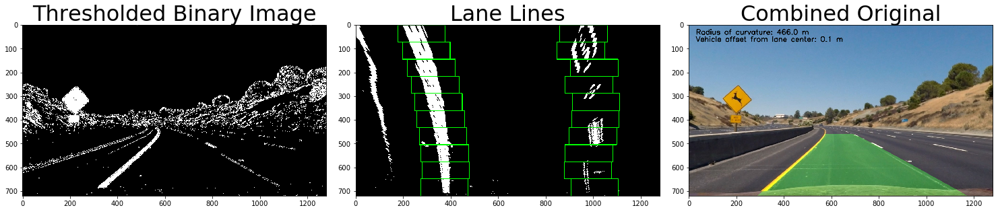

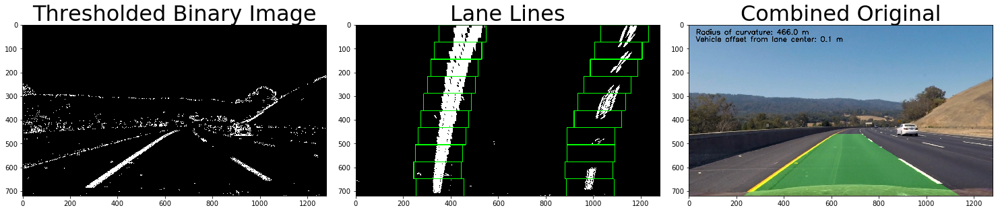

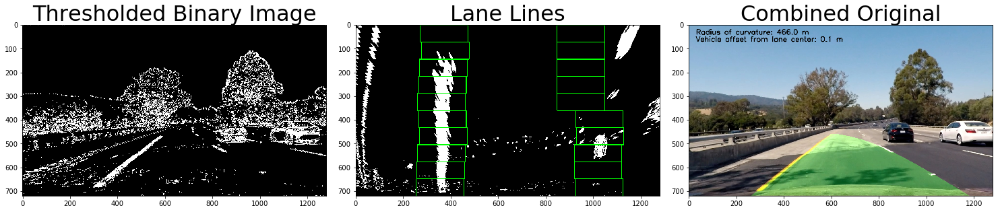

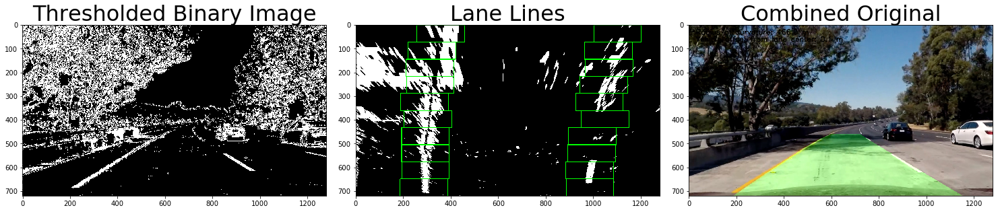

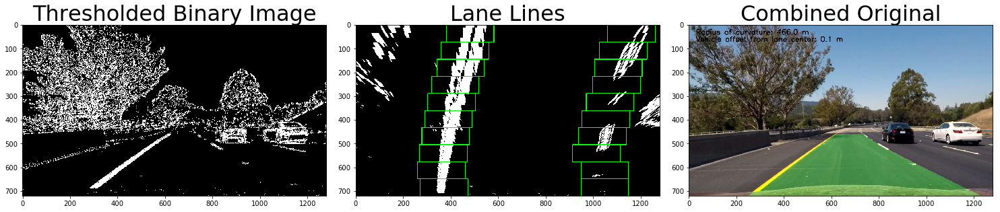

In [37]:
#read all images in folder
images = glob.glob('./test_images/test*.jpg')
for fname in images:
    #Read RGB image
    img = mpimg.imread(fname)
    process_image(img)

## 8. Pipeline (Video)

In [40]:
### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# Set up lines for left and right
left_lane = lines.Line()
right_lane = lines.Line()
file_output = 'project_video_output_v05_v2.mp4'
clip1 = VideoFileClip("project_video_reduce.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(file_output, audio=False)

[MoviePy] >>>> Building video project_video_output_v05_v2.mp4
[MoviePy] Writing video project_video_output_v05_v2.mp4


100%|██████████| 251/251 [01:27<00:00,  2.89it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_v05_v2.mp4 

CPU times: user 1min 18s, sys: 21.1 s, total: 1min 39s
Wall time: 1min 28s


## 5.4 Sliding Window Search with Convolutions

In [ ]:
images = glob.glob('./test_images/test1.jpg')

# Read in a thresholded image
warped = mpimg.imread('./test_images/test1.jpg')
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(binary_warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()


In [ ]:
#Undistort image and crop image test 
fname = './test_images/test1.jpg'
img = cv2.imread(fname)
undistort_image = cv2.undistort(img, mtx, dist, None, mtx)
#toolbox.plot2img(img, undistort_image, ['Orginal', 'undistort_image'])
#dst = cv2.resize(undistort_image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
#toolbox.plot2img(img, dst, ['Orginal', 'undistort_image'])

height, width = undistort_image.shape[:2]
dst2 = cv2.resize(undistort_image, (640,360), interpolation = cv2.INTER_CUBIC)
toolbox.plot2img(undistort_image, dst2, ['Orginal', 'undistort_image'])
